In [3]:
import pandas as pd
import numpy as np
# 데이터를 수집합니다.
train = pd.read_csv("C:/Users/User/Desktop/train.csv")
# 수집된 데이터 샘플을 확인합니다.
train.head()

,index,gender,car,reality,child_num,income_total,income_type,edu_type,family_type,house_type,...,occyp_type_Laborers,occyp_type_Low-skill Laborers,occyp_type_Managers,occyp_type_Medicine staff,occyp_type_Private service staff,occyp_type_Realty agents,occyp_type_Sales staff,occyp_type_Secretaries,occyp_type_Security staff,occyp_type_Waiters/barmen staff
0,3,F,N,Y,0,202500.0,Commercial associate,Secondary / secondary special,Married,House / apartment,...,0,0,0,0,0,0,1,0,0,0
1,7,M,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Married,House / apartment,...,0,0,0,0,0,0,0,0,0,0
2,12,F,Y,Y,1,157500.0,Commercial associate,Secondary / secondary special,Married,House / apartment,...,0,0,0,0,0,0,0,0,0,0
3,15,M,Y,Y,2,157500.0,Working,Secondary / secondary special,Married,With parents,...,0,0,0,0,0,0,0,0,0,0
4,22,F,N,N,0,157500.0,Commercial associate,Secondary / secondary special,Civil marriage,House / apartment,...,1,0,0,0,0,0,0,0,0,0


In [4]:
# 현재 데이터에서 신용등급의 개수를 확인한다
train.credit.value_counts()

2    3220
1    3220
0    3220
Name: credit, dtype: int64

In [5]:
train.car.value_counts()

N    6026
Y    3634
Name: car, dtype: int64

In [6]:
train.reality.value_counts()

Y    6469
N    3191
Name: reality, dtype: int64

Text(0.5,1,'reality and car in 2d plane')

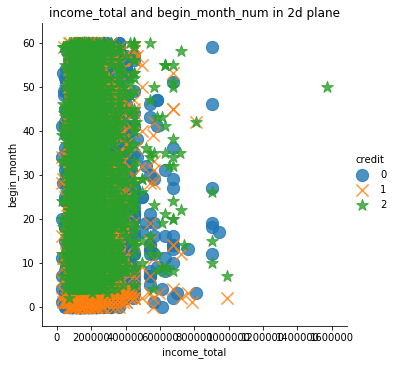

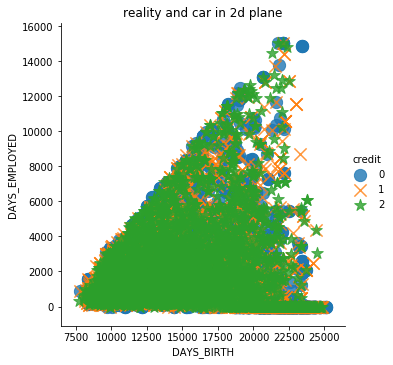

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


sns.lmplot('income_total', 'begin_month', data=train, fit_reg=False, # x축, y축, 데이터, 노 라인
           scatter_kws={"s":150}, # 좌표 상의 점의 크기
           markers=["o", "x", "*"],
          hue="credit") # 예측값
# 타이틀
plt.title('income_total and begin_month_num in 2d plane')


sns.lmplot('DAYS_BIRTH', 'DAYS_EMPLOYED', data=train, fit_reg=False, # x축, y축, 데이터, 노 라인
           scatter_kws={"s":150}, # 좌표 상의 점의 크기
           markers=["o", "x", "*"],
          hue="credit") # 예측값
# 타이틀
plt.title('reality and car in 2d plane')

#이산형 변수라 소용이 없음.

In [7]:
# 사이킷런의 train_test_split을 사용하면 코드 한 줄로 손쉽게 데이터를 나눌 수 있습니다.
from sklearn.model_selection import train_test_split
# 다듬어진 데이터에서 10%를 테스트 데이터로 분류합니다
train_set, test_set = train_test_split(train, test_size=0.1)

In [7]:
train_set.shape[0]

8694

In [8]:
test_set.shape[0]

966

In [9]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import RobustScaler


scaler = MinMaxScaler()

# 최적의 k를 찾기 위해 교차 검증을 수행할 k의 범위를 3부터 학습 데이터 절반까지 지정
max_k_range = train_set.shape[0] // 2
k_list = []
for i in range(90, max_k_range, 90):
    k_list.append(i)
    
cross_validation_scores = []
x_train = train_set[['child_num', 'income_total', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
                  'FLAG_MOBIL', 'work_phone', 'phone', 'email', 'family_size',
                  'begin_month', 'gender_F', 'gender_M', 'car_N', 'car_Y',
                  'reality_N', 'reality_Y', 'income_type_Commercial associate',
                  'income_type_Pensioner', 'income_type_State servant',
                  'income_type_Student', 'income_type_Working',
                  'edu_type_Academic degree', 'edu_type_Higher education',
                  'edu_type_Incomplete higher', 'edu_type_Lower secondary',
                  'edu_type_Secondary / secondary special',
                  'family_type_Civil marriage', 'family_type_Married',
                  'family_type_Separated', 'family_type_Single / not married',
                  'family_type_Widow', 'house_type_Co-op apartment',
                  'house_type_House / apartment', 'house_type_Municipal apartment',
                  'house_type_Office apartment', 'house_type_Rented apartment',
                  'house_type_With parents', 'occyp_type_Accountants',
                  'occyp_type_Cleaning staff', 'occyp_type_Cooking staff',
                  'occyp_type_Core staff', 'occyp_type_Drivers',
                  'occyp_type_HR staff', 'occyp_type_High skill tech staff',
                  'occyp_type_IT staff', 'occyp_type_Laborers',
                  'occyp_type_Low-skill Laborers', 'occyp_type_Managers',
                  'occyp_type_Medicine staff', 'occyp_type_Private service staff',
                  'occyp_type_Realty agents', 'occyp_type_Sales staff',
                  'occyp_type_Secretaries', 'occyp_type_Security staff',
                  'occyp_type_Waiters/barmen staff']] #여기에 분별력이 있는 컬럼들을 써줘야 한다.
y_train = train_set[['credit']]

x_train_scale = scaler.fit_transform(x_train)

# 교차 검증(10-fold)을 각 k를 대상으로 수행해 검증 결과를 저장
for k in k_list:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, x_train_scale, y_train.values.ravel(), cv=10,
                                            scoring='accuracy')
    cross_validation_scores.append(scores.mean())
    
cross_validation_scores

[0.3917644921715698,
 0.3729009324373798,
 0.36714321130167626,
 0.36726478409849805,
 0.3738155829599471,
 0.3704780084494199,
 0.3781859140104121,
 0.3720897163668023,
 0.3723235759240971,
 0.36933281762167774,
 0.37278360996821336,
 0.3733567329340807,
 0.3724352010272196,
 0.36863494310763284,
 0.3711716308008662,
 0.3728883472816137,
 0.3773766774102196,
 0.37599524159152214,
 0.37036385373987696,
 0.36553322074990263,
 0.36875307079420716,
 0.37220346602421395,
 0.36852636325846866,
 0.3711689814338136,
 0.3728921919497081,
 0.37082415293013515,
 0.37554143795498474,
 0.37680249566941837,
 0.3722010833387502,
 0.3770284040894627,
 0.3759929911696145,
 0.3739307833129791,
 0.37416265241659324,
 0.3726689301506287,
 0.37404387162308245,
 0.3758820231417568,
 0.3722059864749,
 0.3692165520925017,
 0.36772176861239436,
 0.3684100980351166,
 0.3649590368778253,
 0.3634612078379357,
 0.36622300849591466,
 0.36599100254454975,
 0.36185572362004337,
 0.362429902605266,
 0.364615268669763

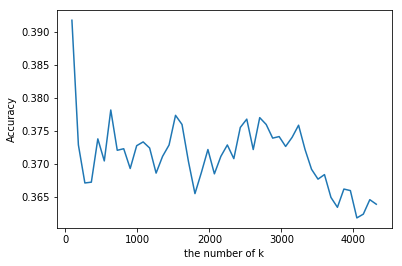

In [10]:
# k에 따른 정확도를 시각화
plt.plot(k_list, cross_validation_scores)
plt.xlabel('the number of k')
plt.ylabel('Accuracy')
plt.show()

In [11]:
# 가장 예측율이 높은 k를 선정
k = k_list[cross_validation_scores.index(max(cross_validation_scores))]
print("The best number of k : " + str(k))

The best number of k : 90


In [12]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

knn = KNeighborsClassifier(n_neighbors=k)

# 학습에 사용될 속성을 지정
x_train = train_set[['child_num', 'income_total', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
                  'FLAG_MOBIL', 'work_phone', 'phone', 'email', 'family_size',
                  'begin_month', 'gender_F', 'gender_M', 'car_N', 'car_Y',
                  'reality_N', 'reality_Y', 'income_type_Commercial associate',
                  'income_type_Pensioner', 'income_type_State servant',
                  'income_type_Student', 'income_type_Working',
                  'edu_type_Academic degree', 'edu_type_Higher education',
                  'edu_type_Incomplete higher', 'edu_type_Lower secondary',
                  'edu_type_Secondary / secondary special',
                  'family_type_Civil marriage', 'family_type_Married',
                  'family_type_Separated', 'family_type_Single / not married',
                  'family_type_Widow', 'house_type_Co-op apartment',
                  'house_type_House / apartment', 'house_type_Municipal apartment',
                  'house_type_Office apartment', 'house_type_Rented apartment',
                  'house_type_With parents', 'occyp_type_Accountants',
                  'occyp_type_Cleaning staff', 'occyp_type_Cooking staff',
                  'occyp_type_Core staff', 'occyp_type_Drivers',
                  'occyp_type_HR staff', 'occyp_type_High skill tech staff',
                  'occyp_type_IT staff', 'occyp_type_Laborers',
                  'occyp_type_Low-skill Laborers', 'occyp_type_Managers',
                  'occyp_type_Medicine staff', 'occyp_type_Private service staff',
                  'occyp_type_Realty agents', 'occyp_type_Sales staff',
                  'occyp_type_Secretaries', 'occyp_type_Security staff',
                  'occyp_type_Waiters/barmen staff']]

x_train_scale = scaler.fit_transform(x_train)

# 예측할 값으로 지정
y_train = train_set[['credit']]

# knn 모델 학습
knn.fit(x_train_scale, y_train.values.ravel())

# 테스트 데이터에서 분류를 위해 사용도리 속성을 지정
x_test = test_set[['child_num', 'income_total', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
                  'FLAG_MOBIL', 'work_phone', 'phone', 'email', 'family_size',
                  'begin_month', 'gender_F', 'gender_M', 'car_N', 'car_Y',
                  'reality_N', 'reality_Y', 'income_type_Commercial associate',
                  'income_type_Pensioner', 'income_type_State servant',
                  'income_type_Student', 'income_type_Working',
                  'edu_type_Academic degree', 'edu_type_Higher education',
                  'edu_type_Incomplete higher', 'edu_type_Lower secondary',
                  'edu_type_Secondary / secondary special',
                  'family_type_Civil marriage', 'family_type_Married',
                  'family_type_Separated', 'family_type_Single / not married',
                  'family_type_Widow', 'house_type_Co-op apartment',
                  'house_type_House / apartment', 'house_type_Municipal apartment',
                  'house_type_Office apartment', 'house_type_Rented apartment',
                  'house_type_With parents', 'occyp_type_Accountants',
                  'occyp_type_Cleaning staff', 'occyp_type_Cooking staff',
                  'occyp_type_Core staff', 'occyp_type_Drivers',
                  'occyp_type_HR staff', 'occyp_type_High skill tech staff',
                  'occyp_type_IT staff', 'occyp_type_Laborers',
                  'occyp_type_Low-skill Laborers', 'occyp_type_Managers',
                  'occyp_type_Medicine staff', 'occyp_type_Private service staff',
                  'occyp_type_Realty agents', 'occyp_type_Sales staff',
                  'occyp_type_Secretaries', 'occyp_type_Security staff',
                  'occyp_type_Waiters/barmen staff']]
x_test_scale = scaler.fit_transform(x_test)

# 정답을 지정
y_test = test_set[['credit']]

# 테스트 시작
pred = knn.predict(x_test_scale)

# 모델 예측 정확도(accuracy) 출력
print("accuracy : " + str( accuracy_score(y_test.values.ravel(), pred)) )

accuracy : 0.39233954451345754


In [13]:
comparison = pd.DataFrame({'prediction':pred, 'ground_truth':y_test.values.ravel()})
comparison

,prediction,ground_truth
0,2,1
1,2,0
2,0,0
3,1,0
4,1,1
5,2,0
6,2,2
7,2,2
8,1,2
9,2,0


#서포트 벡터 머신

In [14]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
import numpy as np


def svc_param_selection(x, y, nfolds):
    svm_parameters = [
                        {'kernel' : ['rbf'],
                         'gamma': [0.01, 0.1, 1],
                         'C': [10, 100, 1000]}
                     ]
    # 사이킷런에서 제공하는 GridSearchCV를 사용해 최적의 파라미터를 구함
    clf = GridSearchCV(SVC(), svm_parameters, cv=5)
    clf.fit(x_train, y_train.values.ravel())
    print(clf.best_params_)

    return clf

x_train = train_set[['child_num', 'income_total', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
                  'FLAG_MOBIL', 'work_phone', 'phone', 'email', 'family_size',
                  'begin_month', 'gender_F', 'gender_M', 'car_N', 'car_Y',
                  'reality_N', 'reality_Y', 'income_type_Commercial associate',
                  'income_type_Pensioner', 'income_type_State servant',
                  'income_type_Student', 'income_type_Working',
                  'edu_type_Academic degree', 'edu_type_Higher education',
                  'edu_type_Incomplete higher', 'edu_type_Lower secondary',
                  'edu_type_Secondary / secondary special',
                  'family_type_Civil marriage', 'family_type_Married',
                  'family_type_Separated', 'family_type_Single / not married',
                  'family_type_Widow', 'house_type_Co-op apartment',
                  'house_type_House / apartment', 'house_type_Municipal apartment',
                  'house_type_Office apartment', 'house_type_Rented apartment',
                  'house_type_With parents', 'occyp_type_Accountants',
                  'occyp_type_Cleaning staff', 'occyp_type_Cooking staff',
                  'occyp_type_Core staff', 'occyp_type_Drivers',
                  'occyp_type_HR staff', 'occyp_type_High skill tech staff',
                  'occyp_type_IT staff', 'occyp_type_Laborers',
                  'occyp_type_Low-skill Laborers', 'occyp_type_Managers',
                  'occyp_type_Medicine staff', 'occyp_type_Private service staff',
                  'occyp_type_Realty agents', 'occyp_type_Sales staff',
                  'occyp_type_Secretaries', 'occyp_type_Security staff',
                  'occyp_type_Waiters/barmen staff']]

y_train = train_set[['credit']]

# 최적의 파라미터로 학습된 모델을 clf로 저장
clf = svc_param_selection(x_train, y_train.values.ravel(), 5)

{'C': 1000, 'gamma': 0.01, 'kernel': 'rbf'}


In [23]:
x_test = test_set[['child_num', 'income_total', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
                  'FLAG_MOBIL', 'work_phone', 'phone', 'email', 'family_size',
                  'begin_month', 'gender_F', 'gender_M', 'car_N', 'car_Y',
                  'reality_N', 'reality_Y', 'income_type_Commercial associate',
                  'income_type_Pensioner', 'income_type_State servant',
                  'income_type_Student', 'income_type_Working',
                  'edu_type_Academic degree', 'edu_type_Higher education',
                  'edu_type_Incomplete higher', 'edu_type_Lower secondary',
                  'edu_type_Secondary / secondary special',
                  'family_type_Civil marriage', 'family_type_Married',
                  'family_type_Separated', 'family_type_Single / not married',
                  'family_type_Widow', 'house_type_Co-op apartment',
                  'house_type_House / apartment', 'house_type_Municipal apartment',
                  'house_type_Office apartment', 'house_type_Rented apartment',
                  'house_type_With parents', 'occyp_type_Accountants',
                  'occyp_type_Cleaning staff', 'occyp_type_Cooking staff',
                  'occyp_type_Core staff', 'occyp_type_Drivers',
                  'occyp_type_HR staff', 'occyp_type_High skill tech staff',
                  'occyp_type_IT staff', 'occyp_type_Laborers',
                  'occyp_type_Low-skill Laborers', 'occyp_type_Managers',
                  'occyp_type_Medicine staff', 'occyp_type_Private service staff',
                  'occyp_type_Realty agents', 'occyp_type_Sales staff',
                  'occyp_type_Secretaries', 'occyp_type_Security staff',
                  'occyp_type_Waiters/barmen staff']]
y_test = test_set[['credit']]

# 최적의 파라미터로 학습된 모델로 테스트를 진행
y_true, y_pred = y_test, clf.predict(x_test)

print(classification_report(y_true, y_pred))
print()
print("accuracy : " + str(accuracy_score(y_true, y_pred)) )

             precision    recall  f1-score   support

          0       0.64      0.52      0.57       332
          1       0.54      0.41      0.47       333
          2       0.41      0.61      0.49       301

avg / total       0.54      0.51      0.51       966


accuracy : 0.510351966873706


In [24]:
comparison2 = pd.DataFrame({'prediction':y_pred,
                          'ground_truth':y_true.values.ravel()})
comparison2

,prediction,ground_truth
0,2,1
1,2,0
2,2,0
3,0,0
4,0,1
5,2,0
6,2,2
7,2,2
8,2,2
9,0,0


#의사결정나무

In [26]:
train_DT = pd.DataFrame(train_set)
train_DT = train_set[['child_num', 'income_total', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
                      'FLAG_MOBIL', 'work_phone', 'phone', 'email', 'family_size',
                      'begin_month', 'gender_F', 'gender_M', 'car_N', 'car_Y',
                      'reality_N', 'reality_Y', 'income_type_Commercial associate',
                      'income_type_Pensioner', 'income_type_State servant',
                      'income_type_Student', 'income_type_Working',
                      'edu_type_Academic degree', 'edu_type_Higher education',
                      'edu_type_Incomplete higher', 'edu_type_Lower secondary',
                      'edu_type_Secondary / secondary special',
                      'family_type_Civil marriage', 'family_type_Married',
                      'family_type_Separated', 'family_type_Single / not married',
                      'family_type_Widow', 'house_type_Co-op apartment',
                      'house_type_House / apartment', 'house_type_Municipal apartment',
                      'house_type_Office apartment', 'house_type_Rented apartment',
                      'house_type_With parents', 'occyp_type_Accountants',
                      'occyp_type_Cleaning staff', 'occyp_type_Cooking staff',
                      'occyp_type_Core staff', 'occyp_type_Drivers',
                      'occyp_type_HR staff', 'occyp_type_High skill tech staff',
                      'occyp_type_IT staff', 'occyp_type_Laborers',
                      'occyp_type_Low-skill Laborers', 'occyp_type_Managers',
                      'occyp_type_Medicine staff', 'occyp_type_Private service staff',
                      'occyp_type_Realty agents', 'occyp_type_Sales staff',
                      'occyp_type_Secretaries', 'occyp_type_Security staff',
                      'occyp_type_Waiters/barmen staff', 'credit']]
test_DT = pd.DataFrame(test_set)
test_DT = test_set[['child_num', 'income_total', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
                    'FLAG_MOBIL', 'work_phone', 'phone', 'email', 'family_size',
                    'begin_month', 'gender_F', 'gender_M', 'car_N', 'car_Y',
                    'reality_N', 'reality_Y', 'income_type_Commercial associate',
                    'income_type_Pensioner', 'income_type_State servant',
                    'income_type_Student', 'income_type_Working',
                    'edu_type_Academic degree', 'edu_type_Higher education',
                    'edu_type_Incomplete higher', 'edu_type_Lower secondary',
                    'edu_type_Secondary / secondary special',
                    'family_type_Civil marriage', 'family_type_Married',
                    'family_type_Separated', 'family_type_Single / not married',
                    'family_type_Widow', 'house_type_Co-op apartment',
                    'house_type_House / apartment', 'house_type_Municipal apartment',
                    'house_type_Office apartment', 'house_type_Rented apartment',
                    'house_type_With parents', 'occyp_type_Accountants',
                    'occyp_type_Cleaning staff', 'occyp_type_Cooking staff',
                    'occyp_type_Core staff', 'occyp_type_Drivers',
                    'occyp_type_HR staff', 'occyp_type_High skill tech staff',
                    'occyp_type_IT staff', 'occyp_type_Laborers',
                    'occyp_type_Low-skill Laborers', 'occyp_type_Managers',
                    'occyp_type_Medicine staff', 'occyp_type_Private service staff',
                    'occyp_type_Realty agents', 'occyp_type_Sales staff',
                    'occyp_type_Secretaries', 'occyp_type_Security staff',
                    'occyp_type_Waiters/barmen staff', 'credit']]

In [27]:
train_DT.credit.value_counts()

2    2919
0    2888
1    2887
Name: credit, dtype: int64

In [28]:
test_DT.credit.value_counts()

1    333
0    332
2    301
Name: credit, dtype: int64

In [29]:
train_DT.head()

,child_num,income_total,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,work_phone,phone,email,family_size,begin_month,...,occyp_type_Low-skill Laborers,occyp_type_Managers,occyp_type_Medicine staff,occyp_type_Private service staff,occyp_type_Realty agents,occyp_type_Sales staff,occyp_type_Secretaries,occyp_type_Security staff,occyp_type_Waiters/barmen staff,credit
9588,0,155250.0,22044,0,1,0,0,0,2,16,...,0,0,0,0,0,0,0,0,0,2
7264,0,247500.0,15125,199,1,0,0,0,2,33,...,0,0,0,0,0,0,0,0,0,2
9358,0,247500.0,10370,1550,1,1,1,0,1,11,...,0,1,0,0,0,0,0,0,0,2
4176,0,81000.0,19661,3046,1,1,1,0,2,0,...,0,1,0,0,0,0,0,0,0,1
4870,0,225000.0,12322,3717,1,0,0,0,2,37,...,0,0,0,0,0,0,0,0,0,1


Text(0.5,1,'district visualization in 2d plane')

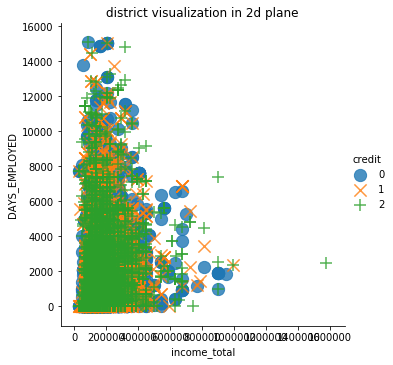

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.lmplot('income_total', 'DAYS_EMPLOYED', data=train_DT, fit_reg=False,
          scatter_kws={"s":150},
          markers=["o", "x", "+"],
          hue="credit")
# title
plt.title('district visualization in 2d plane')

In [58]:
X_train = train_DT[['child_num', 'income_total', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
                      'FLAG_MOBIL', 'work_phone', 'phone', 'email', 'family_size',
                      'begin_month', 'gender_F', 'gender_M', 'car_N', 'car_Y',
                      'reality_N', 'reality_Y', 'income_type_Commercial associate',
                      'income_type_Pensioner', 'income_type_State servant',
                      'income_type_Student', 'income_type_Working',
                      'edu_type_Academic degree', 'edu_type_Higher education',
                      'edu_type_Incomplete higher', 'edu_type_Lower secondary',
                      'edu_type_Secondary / secondary special',
                      'family_type_Civil marriage', 'family_type_Married',
                      'family_type_Separated', 'family_type_Single / not married',
                      'family_type_Widow', 'house_type_Co-op apartment',
                      'house_type_House / apartment', 'house_type_Municipal apartment',
                      'house_type_Office apartment', 'house_type_Rented apartment',
                      'house_type_With parents', 'occyp_type_Accountants',
                      'occyp_type_Cleaning staff', 'occyp_type_Cooking staff',
                      'occyp_type_Core staff', 'occyp_type_Drivers',
                      'occyp_type_HR staff', 'occyp_type_High skill tech staff',
                      'occyp_type_IT staff', 'occyp_type_Laborers',
                      'occyp_type_Low-skill Laborers', 'occyp_type_Managers',
                      'occyp_type_Medicine staff', 'occyp_type_Private service staff',
                      'occyp_type_Realty agents', 'occyp_type_Sales staff',
                      'occyp_type_Secretaries', 'occyp_type_Security staff',
                      'occyp_type_Waiters/barmen staff', 'credit']]
y_train = train_DT[['credit']]

X_test = test_DT[['child_num', 'income_total', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
                      'FLAG_MOBIL', 'work_phone', 'phone', 'email', 'family_size',
                      'begin_month', 'gender_F', 'gender_M', 'car_N', 'car_Y',
                      'reality_N', 'reality_Y', 'income_type_Commercial associate',
                      'income_type_Pensioner', 'income_type_State servant',
                      'income_type_Student', 'income_type_Working',
                      'edu_type_Academic degree', 'edu_type_Higher education',
                      'edu_type_Incomplete higher', 'edu_type_Lower secondary',
                      'edu_type_Secondary / secondary special',
                      'family_type_Civil marriage', 'family_type_Married',
                      'family_type_Separated', 'family_type_Single / not married',
                      'family_type_Widow', 'house_type_Co-op apartment',
                      'house_type_House / apartment', 'house_type_Municipal apartment',
                      'house_type_Office apartment', 'house_type_Rented apartment',
                      'house_type_With parents', 'occyp_type_Accountants',
                      'occyp_type_Cleaning staff', 'occyp_type_Cooking staff',
                      'occyp_type_Core staff', 'occyp_type_Drivers',
                      'occyp_type_HR staff', 'occyp_type_High skill tech staff',
                      'occyp_type_IT staff', 'occyp_type_Laborers',
                      'occyp_type_Low-skill Laborers', 'occyp_type_Managers',
                      'occyp_type_Medicine staff', 'occyp_type_Private service staff',
                      'occyp_type_Realty agents', 'occyp_type_Sales staff',
                      'occyp_type_Secretaries', 'occyp_type_Security staff',
                      'occyp_type_Waiters/barmen staff', 'credit']]
y_test = test_DT[['credit']]

In [59]:
X_train = X_train.drop(['child_num', 'FLAG_MOBIL', 'credit'], axis=1, inplace=False)
X_test = X_test.drop(['child_num', 'FLAG_MOBIL', 'credit'], axis=1, inplace=False)

In [60]:
from sklearn import tree
import numpy as np
import matplotlib.pyplot as plt
from sklearn import preprocessing

le = preprocessing.LabelEncoder()
y_encoded = le.fit_transform(y_train)
clf = tree.DecisionTreeClassifier(random_state=5).fit(X_train, y_encoded)

D:\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [61]:
import graphviz
dot_data = tree.export_graphviz(clf, out_file=None)
graph = graphviz.Source(dot_data)
graph.render("credit")
dot_data = tree.export_graphviz(clf, out_file=None,
                               feature_names = ['income_total', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
                                              'work_phone', 'phone', 'email', 'family_size',
                                              'begin_month', 'gender_F', 'gender_M', 'car_N', 'car_Y',
                                              'reality_N', 'reality_Y', 'income_type_Commercial associate',
                                              'income_type_Pensioner', 'income_type_State servant',
                                              'income_type_Student', 'income_type_Working',
                                              'edu_type_Academic degree', 'edu_type_Higher education',
                                              'edu_type_Incomplete higher', 'edu_type_Lower secondary',
                                              'edu_type_Secondary / secondary special',
                                              'family_type_Civil marriage', 'family_type_Married',
                                              'family_type_Separated', 'family_type_Single / not married',
                                              'family_type_Widow', 'house_type_Co-op apartment',
                                              'house_type_House / apartment', 'house_type_Municipal apartment',
                                              'house_type_Office apartment', 'house_type_Rented apartment',
                                              'house_type_With parents', 'occyp_type_Accountants',
                                              'occyp_type_Cleaning staff', 'occyp_type_Cooking staff',
                                              'occyp_type_Core staff', 'occyp_type_Drivers',
                                              'occyp_type_HR staff', 'occyp_type_High skill tech staff',
                                              'occyp_type_IT staff', 'occyp_type_Laborers',
                                              'occyp_type_Low-skill Laborers', 'occyp_type_Managers',
                                              'occyp_type_Medicine staff', 'occyp_type_Private service staff',
                                              'occyp_type_Realty agents', 'occyp_type_Sales staff',
                                              'occyp_type_Secretaries', 'occyp_type_Security staff',
                                              'occyp_type_Waiters/barmen staff'],
                               class_names=['0', '1', '2'],
                               filled=True, rounded=True,
                               special_characters=True)

graph = graphviz.Source(dot_data)
graph

In [62]:
from sklearn.metrics import accuracy_score
pred = clf.predict(X_test)

In [63]:
print("accuracy : " + str(accuracy_score(y_test.values.ravel(), le.classes_[pred])))

accuracy : 0.4917184265010352


In [64]:
comparison3 = pd.DataFrame({'prediction':le.classes_[pred],
                           'ground_truth':y_test.values.ravel()})
comparison3

,prediction,ground_truth
0,0,1
1,2,0
2,1,0
3,0,0
4,0,1
5,2,0
6,1,2
7,2,2
8,0,2
9,2,0


#XGBoost

In [8]:
import xgboost as xgb ## XGBoost 불러오기
from xgboost import plot_importance ## Feature Importance를 불러오기 위함
from xgboost import XGBClassifier
import pandas as pd
import numpy as np
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix, f1_score, roc_auc_score
import warnings
warnings.filterwarnings('ignore')

In [9]:
y = train_set['credit']
x = train_set.drop(['credit', 'gender', 'car', 'reality', 'income_type',
                'edu_type', 'family_type', 'house_type', 'occyp_type'], axis=1)
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.1, random_state = 11)
print(X_train.shape, X_test.shape)

(7824, 56) (870, 56)


In [10]:
xgb_classifier = XGBClassifier(n_estimator=500, learning_rate=0.1, max_depth=4)
xgb_classifier.fit(X_train, Y_train)
xgb_pred = xgb_classifier.predict(X_test)

[20:54:35] WARNING: ..\src\learner.cc:541: 
Parameters: { n_estimator } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:54:35] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [15]:
accuracy_score(Y_test, xgb_pred)

0.7402298850574712

In [27]:
roc_auc_score(Y_test, preds)

ValueError: multiclass format is not supported

In [85]:
xgb_Classifier = XGBClassifier()

xgb_param_grid = {
    'n_estimators' : [100, 200, 400, 600],
    'learning_rate' : [0.01, 0.05, 0.1, 0.15, 0.2],
    'max_depth' : [4, 6, 8, 10, 12],
}

xgb_grid = GridSearchCV(xgb_Classifier, param_grid = xgb_param_grid, scoring="accuracy", n_jobs=-1, verbose=1)
xgb_grid.fit(X_train, Y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   59.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 14.2min finished
D:\Anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:36:50] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


GridSearchCV(cv=None, error_score='raise',
       estimator=XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
       colsample_bynode=None, colsample_bytree=None, gamma=None,
       gpu_id=None, importance_type='gain', interaction_constraints=None,
       learning_rate=None, max_delta_step=None, max_depth=None,
       min_child_w...e,
       tree_method=None, use_label_encoder=True, validate_parameters=None,
       verbosity=None),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'n_estimators': [100, 200, 400, 600], 'learning_rate': [0.01, 0.05, 0.1, 0.15, 0.2], 'max_depth': [4, 6, 8, 10, 12]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=1)

In [86]:
print("최고 평균 정확도 : {0:.4f}".format(xgb_grid.best_score_))
print("최고의 파라미터 : ", xgb_grid.best_params_)

최고 평균 정확도 : 0.7385
최고의 파라미터 :  {'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 200}


In [87]:
cv_result_df = pd.DataFrame(xgb_grid.cv_results_)
cv_result_df.sort_values(by=['rank_test_score'], inplace=True)

D:\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:122: FutureWarning: You are accessing a training score ('split0_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
D:\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:122: FutureWarning: You are accessing a training score ('split1_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
D:\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:122: FutureWarning: You are accessing a training score ('split2_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
D:\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:122: FutureWarning: You are acc

In [88]:
cv_result_df[['params', 'mean_test_score', 'rank_test_score']].head(10)

,params,mean_test_score,rank_test_score
5,"{'learning_rate': 0.01, 'max_depth': 6, 'n_est...",0.738497,1
60,"{'learning_rate': 0.15, 'max_depth': 4, 'n_est...",0.738497,1
22,"{'learning_rate': 0.05, 'max_depth': 4, 'n_est...",0.738497,1
41,"{'learning_rate': 0.1, 'max_depth': 4, 'n_esti...",0.738113,4
1,"{'learning_rate': 0.01, 'max_depth': 4, 'n_est...",0.737986,5
0,"{'learning_rate': 0.01, 'max_depth': 4, 'n_est...",0.737730,6
2,"{'learning_rate': 0.01, 'max_depth': 4, 'n_est...",0.737730,6
6,"{'learning_rate': 0.01, 'max_depth': 6, 'n_est...",0.737474,8
4,"{'learning_rate': 0.01, 'max_depth': 6, 'n_est...",0.737347,9
20,"{'learning_rate': 0.05, 'max_depth': 4, 'n_est...",0.737347,9


In [23]:
dtrain = xgb.DMatrix(data=X_train, label = Y_train)
dtest = xgb.DMatrix(data=X_test, label=Y_test)

In [24]:
# max_depth = 3, 학습률은 0.1, 예제가 이진분류이므로 목적함수(objective)는 binary:logistic(이진 로지스틱)
# 오류함수의 평가성능지표는 logloss
# 부스팅 반복횟수는 400
# 조기중단을 위한 최소 반복횟수는 100

params = {'max_depth' : 3,
         'eta' : 0.1,
         'eval_metric' : 'logloss',
         'early_stoppings' : 100 }

num_rounds = 400

In [25]:
# train 데이터 세트는 'train', evaluation(test) 데이터 세트는 'eval' 로 명기
evals = [(dtest, 'test')]
wlist = [(dtrain, 'train'), (dtest,'eval')]
# 하이퍼 파라미터와 early stopping 파라미터를 train() 함수의 파라미터로 전달
xgb_model = xgb.train(params = params, dtrain=dtrain, num_boost_round=num_rounds, evals=wlist)

[21:03:38] WARNING: ..\src\learner.cc:541: 
Parameters: { early_stoppings } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-logloss:0.45626	eval-logloss:0.45865
[1]	train-logloss:0.24723	eval-logloss:0.25237
[2]	train-logloss:0.04566	eval-logloss:0.05255
[3]	train-logloss:-0.17266	eval-logloss:-0.16343
[4]	train-logloss:-0.47221	eval-logloss:-0.45825
[5]	train-logloss:-7.37128	eval-logloss:-6.97237
[6]	train-logloss:-9.90612	eval-logloss:-9.89200
[7]	train-logloss:-9.91365	eval-logloss:-9.89924
[8]	train-logloss:-9.92149	eval-logloss:-9.90734
[9]	train-logloss:-9.93196	eval-logloss:-9.91903
[10]	train-logloss:-10.04294	eval-logloss:-10.03355
[11]	train-logloss:-10.03806	eval-logloss:-10.07525
[12]	train-logloss:-10.04110	eval-logloss:-10.07825
[13]	train-logloss:-10.04

[151]	train-logloss:-10.09929	eval-logloss:-10.06366
[152]	train-logloss:-10.09934	eval-logloss:-10.06369
[153]	train-logloss:-10.09915	eval-logloss:-10.06378
[154]	train-logloss:-10.09922	eval-logloss:-10.06381
[155]	train-logloss:-10.09569	eval-logloss:-10.06370
[156]	train-logloss:-10.09572	eval-logloss:-10.06370
[157]	train-logloss:-10.09584	eval-logloss:-10.06376
[158]	train-logloss:-10.09588	eval-logloss:-10.06376
[159]	train-logloss:-10.10020	eval-logloss:-10.06372
[160]	train-logloss:-10.10035	eval-logloss:-10.06377
[161]	train-logloss:-10.10471	eval-logloss:-10.06376
[162]	train-logloss:-10.10475	eval-logloss:-10.06365
[163]	train-logloss:-10.10483	eval-logloss:-10.06386
[164]	train-logloss:-10.10489	eval-logloss:-10.06390
[165]	train-logloss:-10.10862	eval-logloss:-10.06388
[166]	train-logloss:-10.11281	eval-logloss:-10.06385
[167]	train-logloss:-10.11694	eval-logloss:-10.09984
[168]	train-logloss:-10.11315	eval-logloss:-10.09958
[169]	train-logloss:-10.10919	eval-logloss:-10

[306]	train-logloss:-10.23784	eval-logloss:-10.05545
[307]	train-logloss:-10.24184	eval-logloss:-10.05810
[308]	train-logloss:-10.24602	eval-logloss:-10.05812
[309]	train-logloss:-10.24623	eval-logloss:-10.05489
[310]	train-logloss:-10.25026	eval-logloss:-10.02271
[311]	train-logloss:-10.25041	eval-logloss:-10.02271
[312]	train-logloss:-10.25440	eval-logloss:-10.02275
[313]	train-logloss:-10.25450	eval-logloss:-10.02263
[314]	train-logloss:-10.25443	eval-logloss:-10.05787
[315]	train-logloss:-10.25448	eval-logloss:-10.05794
[316]	train-logloss:-10.25474	eval-logloss:-10.05766
[317]	train-logloss:-10.25476	eval-logloss:-10.05766
[318]	train-logloss:-10.25517	eval-logloss:-10.05762
[319]	train-logloss:-10.25137	eval-logloss:-10.05783
[320]	train-logloss:-10.25565	eval-logloss:-10.05744
[321]	train-logloss:-10.25574	eval-logloss:-10.05733
[322]	train-logloss:-10.25579	eval-logloss:-10.05767
[323]	train-logloss:-10.25602	eval-logloss:-10.05812
[324]	train-logloss:-10.25576	eval-logloss:-10

In [26]:
pred_probs = xgb_model.predict(dtest)
print('predict() 수행 결과값을 10개 표시, 예측 확률 값으로 표시')
print(np.round(pred_probs[:10], 3))

#예측 확률이 0.5보다 크면 1, 그렇지 않으면 0으로 예측값 결정해 리스트 객체인 preds에 저장
preds = [ 2 if x > 1 else 1 if x > 0.5 else 0 for x in pred_probs]
print('예측값 10개 표시 : ', preds[:10])

predict() 수행 결과값을 10개 표시, 예측 확률 값으로 표시
[0.048 1.546 0.696 0.605 1.612 0.071 1.648 0.556 1.532 1.66 ]
예측값 10개 표시 :  [0, 2, 1, 1, 2, 0, 2, 1, 2, 2]


In [125]:
comparison4 = pd.DataFrame({'prediction':preds,
                          'ground_truth':Y_test.values.ravel()})
comparison4

,prediction,ground_truth
0,1,1
1,2,2
2,2,2
3,2,2
4,2,2
5,0,0
6,0,0
7,2,2
8,0,0
9,1,1


#가우시안 나이브 베이즈

In [126]:
import pandas as pd
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics
from sklearn.metrics import accuracy_score

In [127]:
model = GaussianNB()
model.fit(X_train, Y_train)

GaussianNB(priors=None)

In [128]:
expected = Y_test
predicted = model.predict(X_test)
print(metrics.classification_report(Y_test, predicted))

             precision    recall  f1-score   support

          0       0.82      0.57      0.67       308
          1       0.63      0.52      0.57       263
          2       0.65      0.95      0.77       299

avg / total       0.70      0.69      0.68       870



In [130]:
accuracy_score(Y_test, predicted)

0.6873563218390805

In [131]:
comparison5 = pd.DataFrame({'prediction':predicted,
                          'ground_truth':Y_test.values.ravel()})
comparison5

,prediction,ground_truth
0,1,1
1,2,2
2,2,2
3,2,2
4,2,2
5,0,0
6,0,0
7,2,2
8,0,0
9,0,1


#앙상블

In [132]:
from sklearn import datasets
from sklearn import tree
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [134]:
dtree = tree.DecisionTreeClassifier(criterion="gini", max_depth=8,
                                   max_features=32, random_state=35)
dtree = dtree.fit(X_train, Y_train)
dtree_predicted = dtree.predict(X_test)

knn = KNeighborsClassifier(n_neighbors=299).fit(X_train, Y_train)
knn_predicted = knn.predict(X_test)

svm = SVC(C=0.1, gamma=0.003, probability=True, random_state=35).fit(X_train, Y_train)
svm_predicted = svm.predict(X_test)
print("[accuracy]")
print("d-tree: ", accuracy_score(Y_test, dtree_predicted))
print("knn   : ", accuracy_score(Y_test, knn_predicted))
print("svm   : ", accuracy_score(Y_test, svm_predicted))

[accuracy]
d-tree:  0.7241379310344828
knn   :  0.6413793103448275
svm   :  0.3022988505747126


In [135]:
svm_proba = svm.predict_proba(X_test)
print(svm_proba[0:2])

[[0.33851856 0.32366309 0.33781835]
 [0.33851856 0.32366309 0.33781835]]


In [136]:
#하드 보팅
voting_clf = VotingClassifier(estimators=[
    ('decision_tree', dtree), ('knn', knn), ('svm', svm)],
    weights=[1,1,1], voting='hard').fit(X_train, Y_train)

hard_voting_predicted = voting_clf.predict(X_test)
accuracy_score(Y_test, hard_voting_predicted)

0.7149425287356321

In [139]:
#소프트 보팅
voting_clf = VotingClassifier(estimators=[
    ('decision_tree', dtree), ('knn', knn), ('svm', svm)],
    weights=[1,1,1], voting='soft').fit(X_train, Y_train)

soft_voting_predicted = voting_clf.predict(X_test)
accuracy_score(Y_test, soft_voting_predicted)

0.7264367816091954

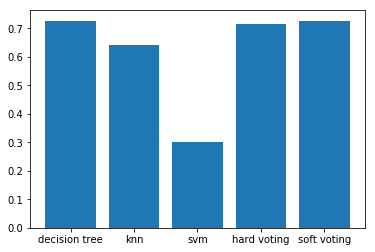

In [141]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

x = np.arange(5)
plt.bar(x, height= [accuracy_score(Y_test, dtree_predicted),
                    accuracy_score(Y_test, knn_predicted),
                    accuracy_score(Y_test, svm_predicted),
                    accuracy_score(Y_test, hard_voting_predicted),
                    accuracy_score(Y_test, soft_voting_predicted)])
plt.xticks(x, ['decision tree','knn','svm','hard voting','soft voting']);

#선형회귀

In [142]:
from tensorflow.keras import optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [143]:
X = np.linspace(0, 10, 10)
Y = X + np.random.randn(*X.shape)

In [146]:
for x, y in zip(X_train,Y_train):
    print(x, y)

index 2
child_num 1
income_total 1
DAYS_BIRTH 0
DAYS_EMPLOYED 2
FLAG_MOBIL 1
work_phone 1
phone 1
email 1
family_size 1
begin_month 0
gender_F 1
gender_M 0
car_N 0
car_Y 2
reality_N 2
reality_Y 1
income_type_Commercial associate 1
income_type_Pensioner 0
income_type_State servant 1
income_type_Student 0
income_type_Working 2
edu_type_Academic degree 0
edu_type_Higher education 2
edu_type_Incomplete higher 2
edu_type_Lower secondary 0
edu_type_Secondary / secondary special 1
family_type_Civil marriage 0
family_type_Married 1
family_type_Separated 2
family_type_Single / not married 1
family_type_Widow 0
house_type_Co-op apartment 0
house_type_House / apartment 2
house_type_Municipal apartment 1
house_type_Office apartment 2
house_type_Rented apartment 1
house_type_With parents 0
occyp_type_Accountants 1
occyp_type_Cleaning staff 1
occyp_type_Cooking staff 0
occyp_type_Core staff 0
occyp_type_Drivers 1
occyp_type_HR staff 0
occyp_type_High skill tech staff 2
occyp_type_IT staff 2
occyp_ty

In [167]:
model = Sequential()
model.add(Dense(input_dim=56, units=1, activation="linear", use_bias=False))

In [168]:
sgd = optimizers.SGD(lr=0.05)
model.compile(optimizer='sgd', loss='mse')

In [169]:
weights = model.layers[0].get_weights()
w = weights[0][0][0]
print('initial w is : ' + str(w))

initial w is : -0.2568667


In [170]:
model.fit(X_train, Y_train, batch_size=50, epochs=10, verbose=1)

Epoch 1/10
7824/7824 [==============================] - 0s 37us/sample - loss: nan 
Epoch 2/10
7824/7824 [==============================] - 0s 12us/sample - loss: nan
Epoch 3/10
7824/7824 [==============================] - 0s 13us/sample - loss: nan
Epoch 4/10
7824/7824 [==============================] - 0s 13us/sample - loss: nan
Epoch 5/10
7824/7824 [==============================] - 0s 13us/sample - loss: nan
Epoch 6/10
7824/7824 [==============================] - 0s 12us/sample - loss: nan
Epoch 7/10
7824/7824 [==============================] - 0s 13us/sample - loss: nan
Epoch 8/10
7824/7824 [==============================] - 0s 12us/sample - loss: nan
Epoch 9/10
7824/7824 [==============================] - 0s 13us/sample - loss: nan
Epoch 10/10
7824/7824 [==============================] - 0s 14us/sample - loss: nan


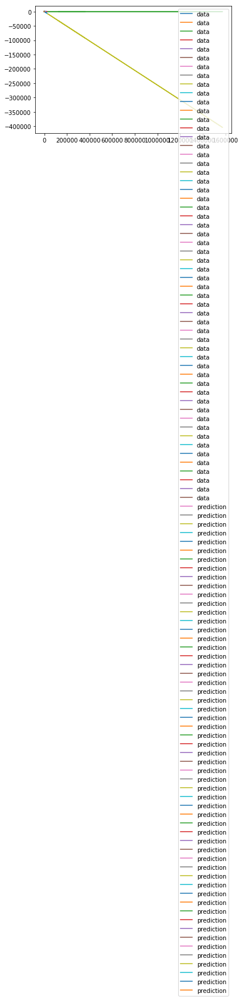

In [171]:
plt.plot(X_train, Y_train, label='data')
plt.plot(X_train, w*X_train, label='prediction')
plt.legend()
plt.show()

In [166]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
import numpy as np

In [174]:
model = Sequential()
#입력 1개를 받아 출력 1개를 리턴하는 선형 회귀 레이어를 생성합니다.
model.add(Dense(input_dim=56, units=1))
#선형 회귀의 출력값을 시그모이드에 연결합니다.
model.add(Activation('sigmoid'))
#크로스 엔트로피를 비용함수로 설정해 경사하강법으로 학습합니다.
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['binary_accuracy'])

In [175]:
model.fit(X_train, Y_train, epochs=300, verbose=0)

In [176]:
model.predict([0, 1, 2])

ValueError: Error when checking input: expected dense_6_input to have shape (56,) but got array with shape (1,)

#로지스틱 회귀

In [177]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
import numpy as np

In [185]:
model = Sequential()

#56개의입력을 받아 1개의 출력을 리턴합니다.
model.add(Dense(input_dim=56, units=1))

#이전 레이어의 출력값을 입력으로 받아 시그모이드 출력을 리턴합니다.
model.add(Activation('softmax'))

#크로스 엔트로피 비용함수를 사용해 경사하강법으로 학습을 진행합니다.
model.compile(loss='sparse_categorical_crossentropy', optimizer='sgd', metrics=['sparse_categorical_accuracy'])

In [186]:
model.fit(X_train, Y_train, epochs=500, verbose=1)

Epoch 1/500


InvalidArgumentError: Received a label value of 2 which is outside the valid range of [0, 1).  Label values: 2 2 0 1 2 1 2 0 1 2 0 1 2 0 0 0 0 0 2 2 0 2 0 2 2 2 2 0 1 2 1 1
	 [[{{node loss_10/activation_5_loss/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits}}]]

#주성분 분석

In [189]:
X_train.head()

,index,child_num,income_total,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,work_phone,phone,email,family_size,...,occyp_type_Laborers,occyp_type_Low-skill Laborers,occyp_type_Managers,occyp_type_Medicine staff,occyp_type_Private service staff,occyp_type_Realty agents,occyp_type_Sales staff,occyp_type_Secretaries,occyp_type_Security staff,occyp_type_Waiters/barmen staff
8373,3039,0,126000.0,19191,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
5388,9285,0,391500.0,17522,1526,1,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
5969,11776,0,121500.0,22046,2011,1,0,0,0,2,...,1,0,0,0,0,0,0,0,0,0
1274,10614,0,157500.0,9862,2135,1,1,0,0,1,...,1,0,0,0,0,0,0,0,0,0
6638,322,1,202500.0,16184,1003,1,0,0,0,3,...,0,0,0,0,0,0,0,0,0,0


In [190]:
from sklearn.preprocessing import StandardScaler

x_std = StandardScaler().fit_transform(X_train)
print(x_std)

[[-0.67786804 -0.58782057 -0.61128492 ... -0.05992984 -0.1299857
  -0.06408413]
 [ 0.25189423 -0.58782057  2.05896013 ... -0.05992984  7.6931538
  -0.06408413]
 [ 0.6226976  -0.58782057 -0.65654331 ... -0.05992984 -0.1299857
  -0.06408413]
 ...
 [-0.6348483  -0.58782057 -0.7244309  ... -0.05992984 -0.1299857
  -0.06408413]
 [-0.82300384 -0.58782057  0.15810772 ... -0.05992984 -0.1299857
  -0.06408413]
 [ 2.261318   -0.58782057  1.74215139 ... -0.05992984 -0.1299857
  -0.06408413]]


In [191]:
Y_train.head()

8373    2
5388    1
5969    1
1274    0
6638    2
Name: credit, dtype: int64

In [192]:
features = x_std.T
covariance_matrix = np.cov(features)
print(covariance_matrix)

[[ 1.00012783 -0.01325245  0.00357323 ... -0.01004688 -0.02296145
   0.01278172]
 [-0.01325245  1.00012783  0.02846893 ... -0.00274086  0.00499577
   0.01759965]
 [ 0.00357323  0.02846893  1.00012783 ... -0.00311798  0.00374058
  -0.01697007]
 ...
 [-0.01004688 -0.00274086 -0.00311798 ...  1.00012783 -0.00779102
  -0.00384104]
 [-0.02296145  0.00499577  0.00374058 ... -0.00779102  1.00012783
  -0.00833109]
 [ 0.01278172  0.01759965 -0.01697007 ... -0.00384104 -0.00833109
   1.00012783]]


In [193]:
#고유벡터: 변환시킨 행렬이 평행하지만 크기만 바뀌게 해주는 벡터
eig_vals, eig_vecs = np.linalg.eig(covariance_matrix)

In [194]:
print('Eigenvectors \n%s' %eig_vecs)

Eigenvectors 
[[-1.48407703e-02+0.00000000e+00j -3.29938489e-03+0.00000000e+00j
  -1.29850241e-03+0.00000000e+00j ... -1.63482505e-17+5.70714143e-17j
   6.42961661e-17+0.00000000e+00j  0.00000000e+00+0.00000000e+00j]
 [ 2.29368231e-01+0.00000000e+00j -4.79144632e-02+0.00000000e+00j
  -1.63094779e-01+0.00000000e+00j ...  5.00616972e-14-2.03777631e-13j
  -1.47407396e-13+0.00000000e+00j  0.00000000e+00+0.00000000e+00j]
 [ 1.55384631e-01+0.00000000e+00j  1.02413566e-01+0.00000000e+00j
  -1.48927768e-01+0.00000000e+00j ...  2.43104930e-16-7.76615697e-17j
  -1.81558680e-16+0.00000000e+00j  0.00000000e+00+0.00000000e+00j]
 ...
 [-5.42523693e-03+0.00000000e+00j -3.49318457e-02+0.00000000e+00j
  -1.24181102e-02+0.00000000e+00j ...  4.45563096e-17-6.46619859e-17j
  -4.93450861e-17+0.00000000e+00j  0.00000000e+00+0.00000000e+00j]
 [ 2.56706558e-02+0.00000000e+00j  4.10725672e-02+0.00000000e+00j
   7.09639822e-02+0.00000000e+00j ...  5.44551508e-16-5.46011600e-16j
  -3.35218680e-16+0.00000000e+00j

In [195]:
print('\nEigenvalues \n%s' %eig_vals)


Eigenvalues 
[ 3.90339718e+00+0.00000000e+00j  2.58449351e+00+0.00000000e+00j
  2.48003425e+00+0.00000000e+00j  2.32272520e+00+0.00000000e+00j
  1.90505101e+00+0.00000000e+00j  1.51921305e-01+0.00000000e+00j
  1.72579026e+00+0.00000000e+00j  2.82957913e-01+0.00000000e+00j
  2.59938983e-04+0.00000000e+00j  1.52996296e+00+0.00000000e+00j
  1.49007831e+00+0.00000000e+00j  1.42747483e+00+0.00000000e+00j
  5.67601841e-01+0.00000000e+00j  5.98070716e-01+0.00000000e+00j
  1.32737503e+00+0.00000000e+00j  6.91461434e-01+0.00000000e+00j
  7.34582324e-01+0.00000000e+00j  1.25458869e+00+0.00000000e+00j
  1.23610088e+00+0.00000000e+00j  7.87586450e-01+0.00000000e+00j
  8.33130948e-01+0.00000000e+00j  1.15328584e+00+0.00000000e+00j
  8.70888645e-01+0.00000000e+00j  8.88369289e-01+0.00000000e+00j
  8.97733944e-01+0.00000000e+00j  1.12048219e+00+0.00000000e+00j
  1.10860431e+00+0.00000000e+00j  1.10568280e+00+0.00000000e+00j
  9.09355651e-01+0.00000000e+00j  1.09153467e+00+0.00000000e+00j
  9.2816262

In [196]:
eig_vals[0] / sum(eig_vecs)

array([   4.51317267+0.j        ,   -4.82787843-0.j        ,
         -5.53388655-0.j        ,   12.82834088+0.j        ,
         11.49402882+0.j        ,    1.25794176+0.j        ,
          9.77304707+0.j        ,    2.25826559+0.j        ,
        -14.7506727 -0.j        ,    9.31221943+0.j        ,
          3.78230547+0.j        ,   71.88226548+0.j        ,
         -8.10291458-0.j        ,    7.38132406+0.j        ,
         44.29797526+0.j        , -253.97649533-0.j        ,
          4.01160536+0.j        ,   -2.27635202-0.j        ,
         -6.72991788-0.j        ,   11.74665363+0.j        ,
       -143.56554702-0.j        ,   11.53704526+0.j        ,
        -22.45251009-0.j        ,  -93.77516342-0.j        ,
        -17.48983952-0.j        ,  -13.7675109 -0.j        ,
        -11.184162  -0.j        ,   30.32772153+0.j        ,
         -6.29057526-0.j        ,  -23.49224816-0.j        ,
          4.9636016 +0.j        ,   10.0433452 +0.j        ,
        -26.69985988-0.j

In [197]:
projected_X = x_std.dot(eig_vecs.T[0] / np.linalg.norm(eig_vecs.T[0]))
projected_X

array([-3.33118704+0.j, -0.57732211+0.j, -1.57583828+0.j, ...,
       -2.68544658+0.j, -0.39964906+0.j, -2.74055481+0.j])

In [201]:
result = pd.DataFrame(projected_X, columns=['PC1'])
result['y-axis'] = 0.0
result['label'] = Y_train
result.head()

,PC1,y-axis,label
0,(-3.3311870413730955+0j),0.0,0.0
1,(-0.5773221133553961+0j),0.0,0.0
2,(-1.5758382824926067+0j),0.0,0.0
3,(1.6372769320775262+0j),0.0,0.0
4,(1.0634522598606198+0j),0.0,0.0


Text(0.5,1,'PCA result')

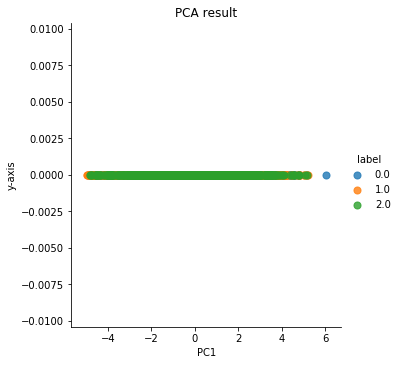

In [202]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.lmplot('PC1', 'y-axis', data=result, fit_reg=False,  # x-axis, y-axis, data, no line
           scatter_kws={"s": 50}, # marker size
           hue="label") # color

plt.title('PCA result')

In [203]:
from sklearn import decomposition
pca = decomposition.PCA(n_components=1)
sklearn_pca_x = pca.fit_transform(x_std)

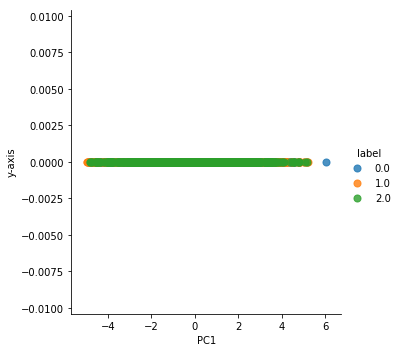

In [205]:
sklearn_result = pd.DataFrame(sklearn_pca_x, columns=['PC1'])
sklearn_result['y-axis'] = 0.0
sklearn_result['label'] = Y_train

sns.lmplot('PC1', 'y-axis', data=sklearn_result, fit_reg=False,  # x-axis, y-axis, data, no line
           scatter_kws={"s": 50}, # marker size
           hue="label") # color